# Inferring subsurface porosity from seismic trace data with uncertainty evaluation using ensemble deep learning

## 0. Importing Required Libraries

In [1]:
##########################################################################################################################
import tensorflow_addons as tfa
import tensorflow as tf
import keras
from keras.layers import Dense
from keras.utils import normalize
from keras.models import Sequential,load_model
##########################################################################################################################
import numpy as np
import pandas as pd
import pyvista as pv
import matplotlib.pyplot as plt
from numpy import arange,absolute,mean,std
##########################################################################################################################

## 1. Data Preparation

In [2]:
SeismicData = np.loadtxt('Data/F3BlackSeisTrace.dat', unpack = True)
SeisData=SeismicData.T
SeiSamples = pd.DataFrame(SeisData)
Seisdf=SeiSamples.drop([0, 1], axis=1)
Predictors = normalize(Seisdf, axis=1)
n_inputs, n_outputs = Seisdf.shape[1], Seisdf.shape[1]

## 2. Importing Models

In [3]:
ADAM_ReLuModel= load_model('Models/MLP-1.hdf5');RMSP_TanhModel= load_model('Models/MLP-2.hdf5');
RMSP_ReLuModel= load_model('Models/MLP-3.hdf5'); ADAM_TanhModel= load_model('Models/MLP-4.hdf5');
NADAM_ReLuModel= load_model('Models/MLP-5.hdf5');NADAM_TanhModel= load_model('Models/MLP-6.hdf5')
ADAMAX_ReLuModel= load_model('Models/MLP-7.hdf5');ADAMAX_TanhModel= load_model('Models/MLP-8.hdf5')

## 3. Make Ensemble Prediction

In [4]:
AppResult = pd.DataFrame()
Realization=[]
AgvEnsResult=[]
WAgvEnsResult=[]
##########################################################################################################################
def WEn_realizationWEns():
    n_members = 8
    Models = [ADAMAX_ReLuModel,NADAM_ReLuModel,RMSP_ReLuModel,ADAM_ReLuModel,NADAM_TanhModel,
              ADAM_TanhModel,RMSP_TanhModel,ADAMAX_TanhModel]
    
    PorosityPred = [model.predict(Predictors) for model in Models]
    PredPorosity =np.array(PorosityPred)
    Realization.append(PredPorosity)
##########################################################################################################################
    Weights = [1.0/n_members for _ in range(n_members)]
    AvgEnsPred = np.tensordot(PorosityPred, Weights, axes=((0),(0)))
    AgvEnsResult.append(AvgEnsPred)
##########################################################################################################################
    WeightAv= [0.25,0.2,0.15,0.13,0.09,0.08,0.05,0.05]
    WAvgEnsPred = np.tensordot(PredPorosity, WeightAv, axes=((0),(0)))
    WAgvEnsResult.append(WAvgEnsPred)
##########################################################################################################################
WEn_realizationWEns()
##########################################################################################################################
AppResult['MLP-1']=Realization[0][0].reshape(-1)
AppResult['MLP-2']=Realization[0][1].reshape(-1)
AppResult['MLP-3']=Realization[0][2].reshape(-1)
AppResult['MLP-4']=Realization[0][3].reshape(-1)
AppResult['MLP-5']=Realization[0][4].reshape(-1)
AppResult['MLP-6']=Realization[0][5].reshape(-1)
AppResult['MLP-7']=Realization[0][6].reshape(-1)
AppResult['MLP-8']=Realization[0][7].reshape(-1)
AppResult['StDev']=std(AppResult, axis=1)
AppResult['AvgEnModel']=AgvEnsResult[0].reshape(-1)
AppResult['WAvgEnModel']=WAgvEnsResult[0].reshape(-1)
#AppResult.to_csv('TestResult.csv')
##########################################################################################################################
AppResult

1263/1263 [==============================] - 2s 2ms/step


,MLP-1,MLP-2,MLP-3,MLP-4,MLP-5,MLP-6,MLP-7,MLP-8,StDev,AvgEnModel,WAvgEnModel
0,0.301170,0.297037,0.293472,0.292805,0.295363,0.294665,0.291315,0.305225,0.004366,0.296382,0.296768
1,0.315043,0.309338,0.311169,0.306986,0.305917,0.311124,0.307133,0.312793,0.002963,0.309938,0.310630
2,0.333403,0.327067,0.325796,0.325973,0.325836,0.331403,0.329285,0.331453,0.002829,0.328777,0.328884
3,0.340059,0.337411,0.332684,0.339513,0.338668,0.345973,0.339722,0.341956,0.003532,0.339498,0.338778
4,0.340922,0.341976,0.331313,0.340263,0.341003,0.349650,0.340104,0.342700,0.004662,0.340992,0.340359
...,...,...,...,...,...,...,...,...,...,...,...
3070471,0.279812,0.284398,0.281789,0.280304,0.283329,0.285884,0.278901,0.283792,0.002305,0.282276,0.282046
3070472,0.285913,0.289402,0.287927,0.285523,0.290790,0.292831,0.285694,0.289754,0.002504,0.288479,0.288036
3070473,0.290859,0.292436,0.292517,0.289636,0.297194,0.298457,0.293584,0.296548,0.002963,0.293904,0.292863
3070474,0.291169,0.292786,0.291164,0.288478,0.296944,0.296405,0.295049,0.293844,0.002712,0.293230,0.292408


## 4. Data Preparation

In [5]:
AppRealization=AppResult[['MLP-1','MLP-2','MLP-3','MLP-4','MLP-5','MLP-6','MLP-7','MLP-8','StDev']]
AppUE=pd.DataFrame(AppRealization)
AppUE['UEv']=AppUE['StDev']/np.sqrt(8)
AppUE['WAvgEnsem']=AppResult['WAvgEnModel']
AppUE

,MLP-1,MLP-2,MLP-3,MLP-4,MLP-5,MLP-6,MLP-7,MLP-8,StDev,UEv,WAvgEnsem
0,0.301170,0.297037,0.293472,0.292805,0.295363,0.294665,0.291315,0.305225,0.004366,0.001544,0.296768
1,0.315043,0.309338,0.311169,0.306986,0.305917,0.311124,0.307133,0.312793,0.002963,0.001048,0.310630
2,0.333403,0.327067,0.325796,0.325973,0.325836,0.331403,0.329285,0.331453,0.002829,0.001000,0.328884
3,0.340059,0.337411,0.332684,0.339513,0.338668,0.345973,0.339722,0.341956,0.003532,0.001249,0.338778
4,0.340922,0.341976,0.331313,0.340263,0.341003,0.349650,0.340104,0.342700,0.004662,0.001648,0.340359
...,...,...,...,...,...,...,...,...,...,...,...
3070471,0.279812,0.284398,0.281789,0.280304,0.283329,0.285884,0.278901,0.283792,0.002305,0.000815,0.282046
3070472,0.285913,0.289402,0.287927,0.285523,0.290790,0.292831,0.285694,0.289754,0.002504,0.000885,0.288036
3070473,0.290859,0.292436,0.292517,0.289636,0.297194,0.298457,0.293584,0.296548,0.002963,0.001047,0.292863
3070474,0.291169,0.292786,0.291164,0.288478,0.296944,0.296405,0.295049,0.293844,0.002712,0.000959,0.292408


## 5. Result Mapping

In [6]:
SeismicTrace = Seisdf.to_numpy().T
SeismicTrace=SeismicTrace.reshape(76,201,201)
SeismCube = []
##########################################################################################################################
for image in range(SeismicTrace.shape[0]):
    input_img = SeismicTrace[image,:,:]    
    SeismCube.append(input_img)
SeismicTraceCube = np.array(SeismCube)
##########################################################################################################################
PredEnsAvg = AppUE['WAvgEnsem'].to_numpy().reshape(40401,76).T
PredEnsAvg=PredEnsAvg.reshape(76,201,201)
PredEnsAvgCube = []
##########################################################################################################################
for image in range(PredEnsAvg.shape[0]):
    input_img = PredEnsAvg[image,:,:]    
    PredEnsAvgCube.append(input_img)
PredPorosityCube = np.array(PredEnsAvgCube)
##########################################################################################################################
PredEnsAvgUnc = AppUE['UEv'].to_numpy().reshape(40401,76).T
PredEnsAvgUnc=PredEnsAvgUnc.reshape(76,201,201)
UncertaintyCube = []
##########################################################################################################################
for image in range(PredEnsAvgUnc.shape[0]):
    input_img = PredEnsAvgUnc[image,:,:]    
    UncertaintyCube.append(input_img)
PredUncertaintyCube = np.array(UncertaintyCube)

## 6. Defining Volume Structure

In [7]:
mat_sliceSeis = SeismicTraceCube[8:]
TransposedDataSeis=mat_sliceSeis.T
FlippedDataSeis=np.flip(TransposedDataSeis)
VolumeSeis = pv.UniformGrid()
VolumeSeis.dimensions = FlippedDataSeis.shape
VolumeSeis.origin = (0 , 0 , 0)
VolumeSeis.spacing = (1, 1, 3)
VolumeSeis.point_data["Seismic (Amplitude)"] = FlippedDataSeis.flatten(order='F').T
###########################################################################################################################
mat_slicePor = PredPorosityCube[8:]
TransposedDataPor=mat_slicePor.T
FlippedDataPor=np.flip(TransposedDataPor)
VolumePor = pv.UniformGrid()
VolumePor.dimensions = FlippedDataPor.shape
VolumePor.origin = (0 , 0 , 0)
VolumePor.spacing = (1, 1, 3) 
VolumePor.point_data["Porosity (Fraction)"] = FlippedDataPor.flatten(order='F').T
###########################################################################################################################
mat_sliceUn = PredUncertaintyCube[8:]
TransposedDataUn=mat_sliceUn.T
FlippedDataUn=np.flip(TransposedDataUn)
VolumeUn = pv.UniformGrid()
VolumeUn.dimensions = FlippedDataUn.shape
VolumeUn.origin = (0 , 0 , 0)
VolumeUn.spacing = (1, 1, 3) 
VolumeUn.point_data["Uncertainty Profile"] = FlippedDataUn.flatten(order='F').T

## 7. Volume Visualization

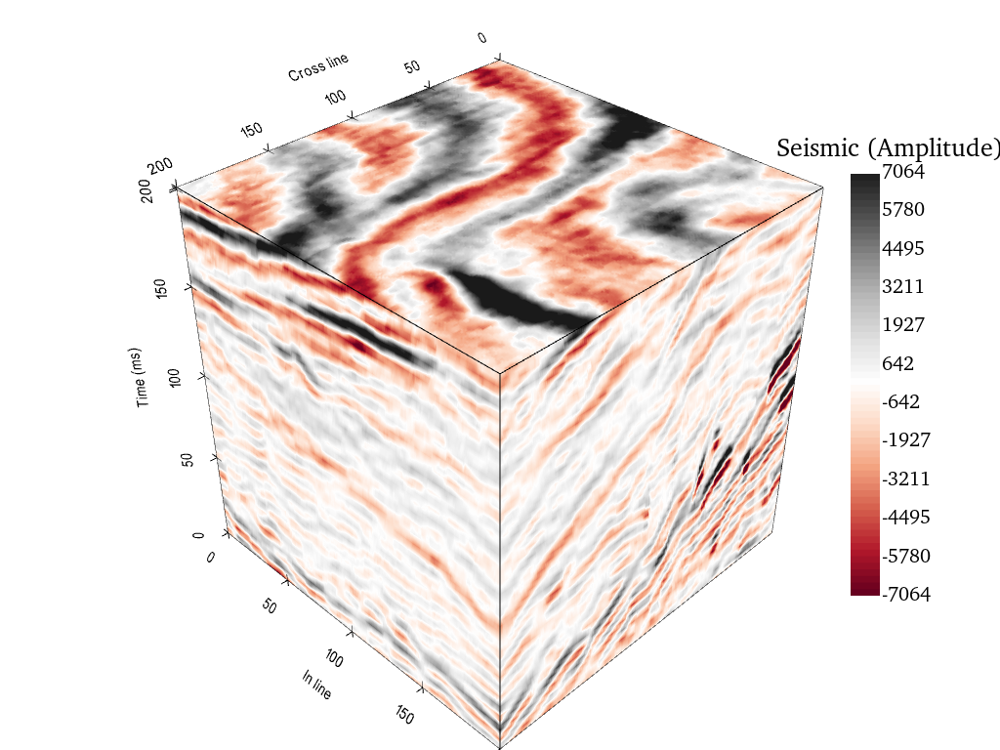

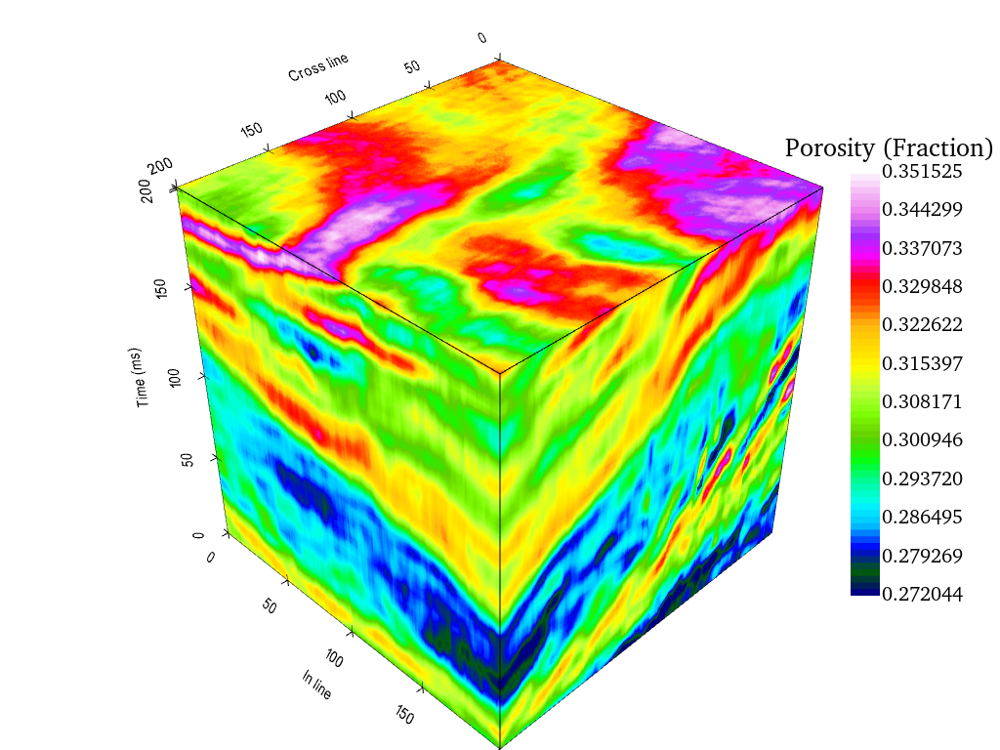

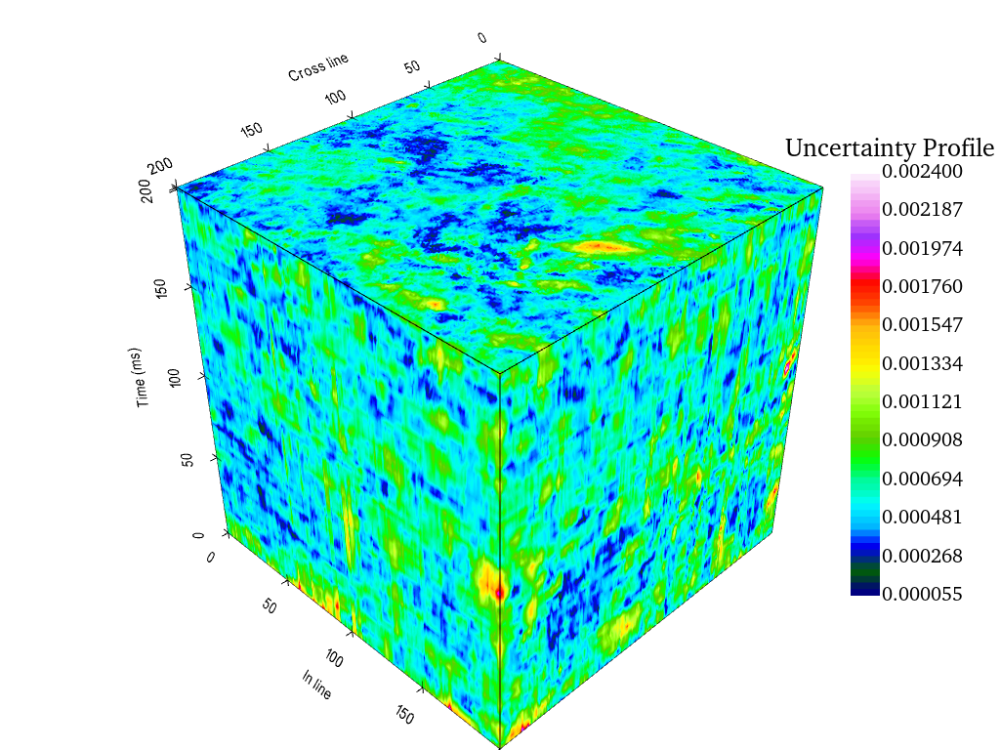

In [8]:
pv.set_jupyter_backend('static') 
pv.global_theme.background = 'white' 
ValuePor1 = dict(height=0.6, vertical=True  ,position_x=0.85, position_y=0.20 ,
             title_font_size=26, label_font_size=20 ,shadow=False ,n_labels=12 ,
             italic=False ,fmt="%.2f" ,font_family="times",color='k')
ValueSeis1 = dict(height=0.6, vertical=True  ,position_x=0.85, position_y=0.20 ,
             title_font_size=26, label_font_size=20 ,shadow=False ,n_labels=12 ,
             italic=False ,fmt="%.0f" ,font_family="times",color='k')
pSeis1 = pv.Plotter()
pSeis1.add_mesh(VolumeSeis ,clim=[-7064,7064] ,flip_scalars=False ,cmap='RdGy' ,lighting=False ,
               scalar_bar_args=ValueSeis1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
pSeis1.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
pSeis1.show()
###########################################################################################################################
ValuePor1 = dict(height=0.6, vertical=True  ,position_x=0.85, position_y=0.20 ,
             title_font_size=26, label_font_size=20 ,shadow=False ,n_labels=12 ,
             italic=False ,fmt="%.6f" ,font_family="times",color='k')
pPor1 = pv.Plotter()
pPor1.add_mesh(VolumePor ,clim=[0.2720436,0.3515245] ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
pPor1.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
pPor1.show()
###########################################################################################################################
ValueUn = dict(height=0.6, vertical=True  ,position_x=0.85, position_y=0.20 ,
             title_font_size=26, label_font_size=20 ,shadow=False ,n_labels=12 ,
             italic=False ,fmt="%.6f" ,font_family="times",color='k')
pUn = pv.Plotter()
pUn.add_mesh(VolumeUn,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
pUn.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
pUn.show()

## 8. XYZ Visualization

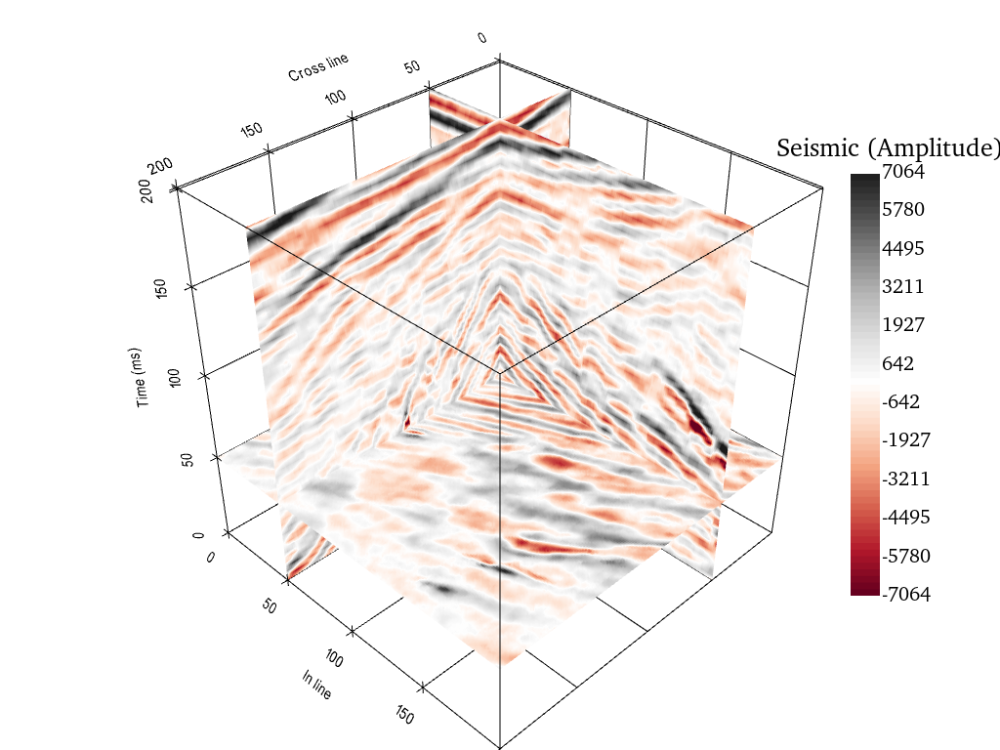

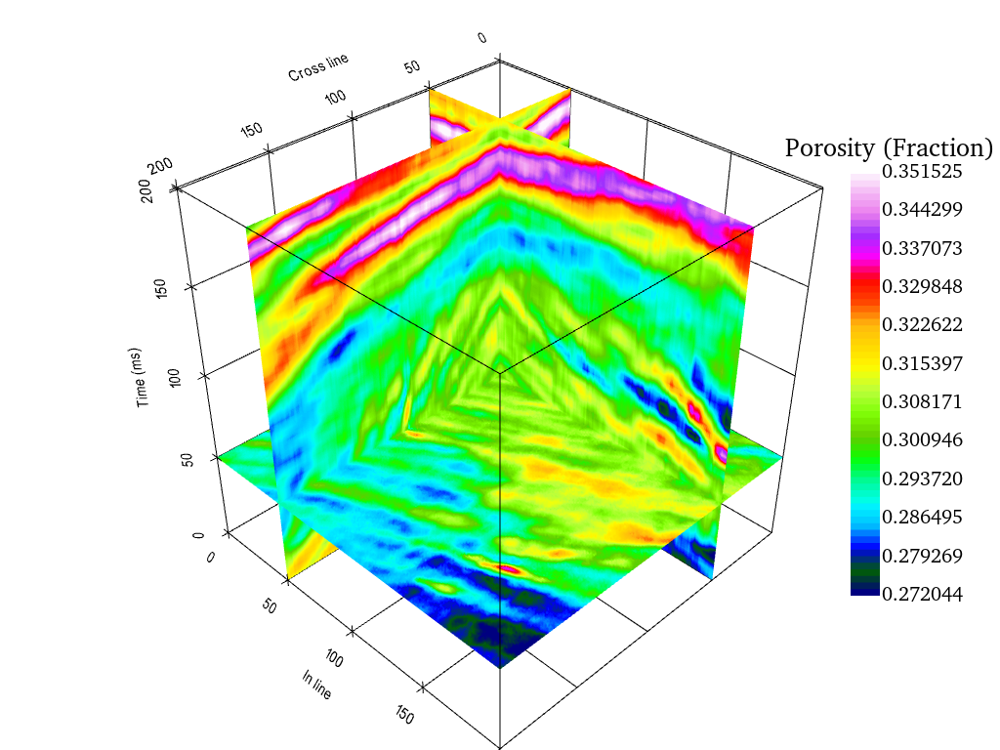

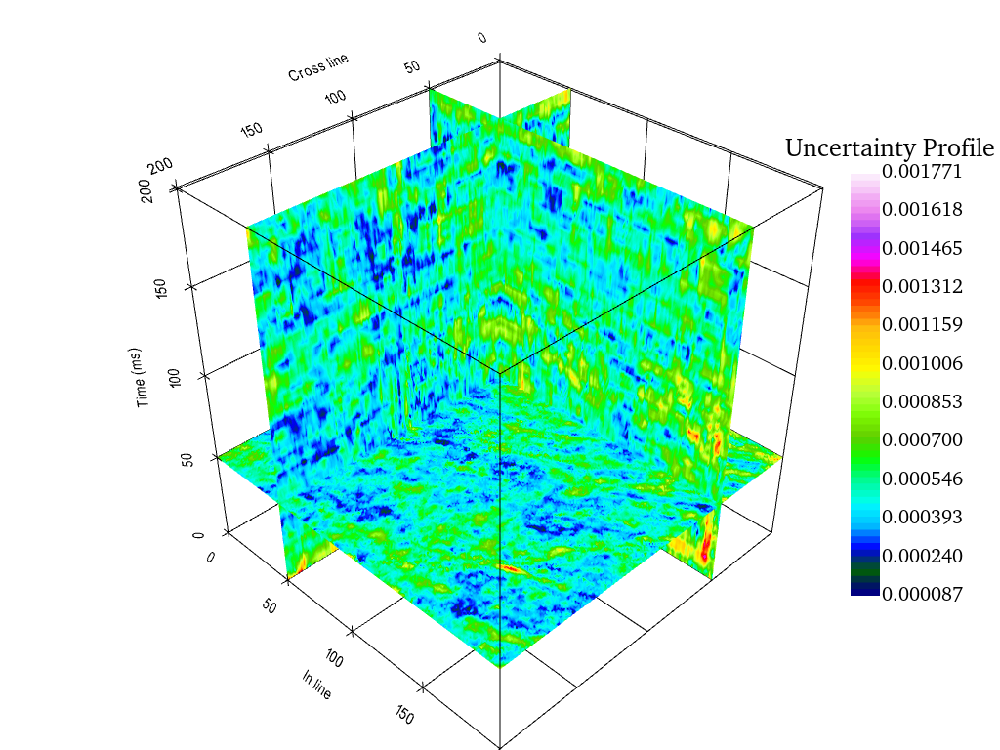

In [9]:
sliceIMGSeis = pv.Plotter()
sliceIMGSeis.add_mesh(VolumeSeis.slice_orthogonal(x=50, y=50 , z=50) ,clim=[-7064,7064] ,flip_scalars=False,
                      cmap='RdGy' ,lighting=False ,scalar_bar_args=ValueSeis1 ,render_points_as_spheres=False,
                      render_lines_as_tubes=True ,use_transparency=False ,smooth_shading=True ,annotations=False,
                      pbr=True ,roughness=0.5 ,edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
sliceIMGSeis.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
sliceIMGSeis.show()
###########################################################################################################################
sliceIMG = pv.Plotter()
sliceIMG.add_mesh(VolumePor.slice_orthogonal(x=50, y=50 , z=50) ,clim=[0.2720436,0.3515245] ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
sliceIMG.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
sliceIMG.show()
###########################################################################################################################
sliceUn = pv.Plotter()
sliceUn.add_mesh(VolumeUn.slice_orthogonal(x=50, y=50 , z=50) ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
sliceUn.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
sliceUn.show()

## 5. Z Visualization

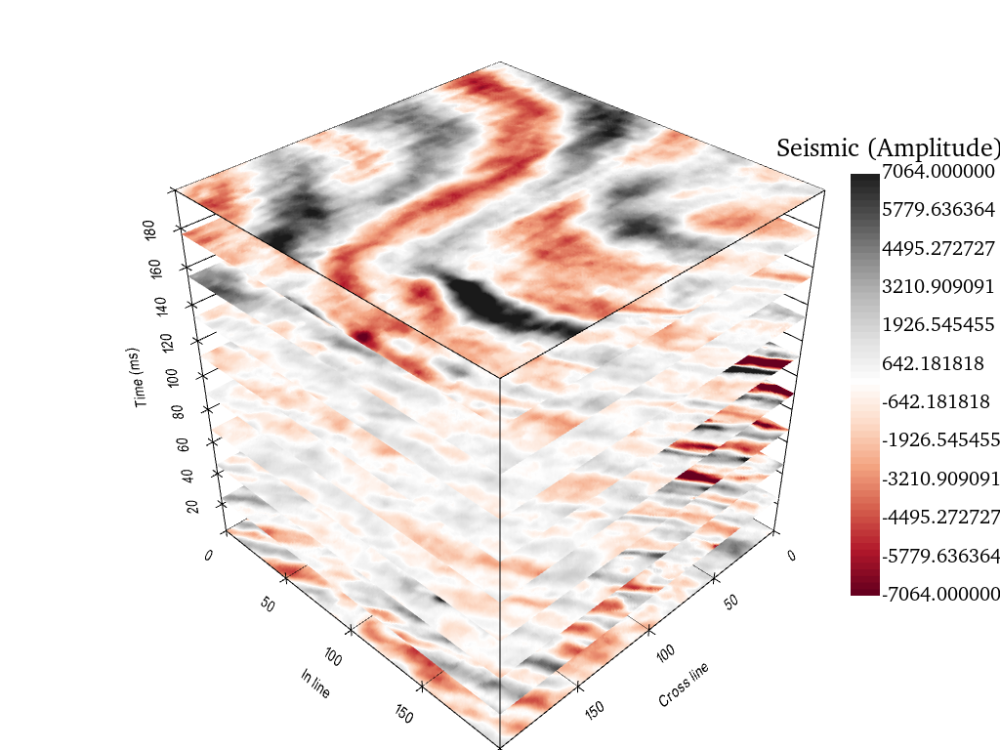

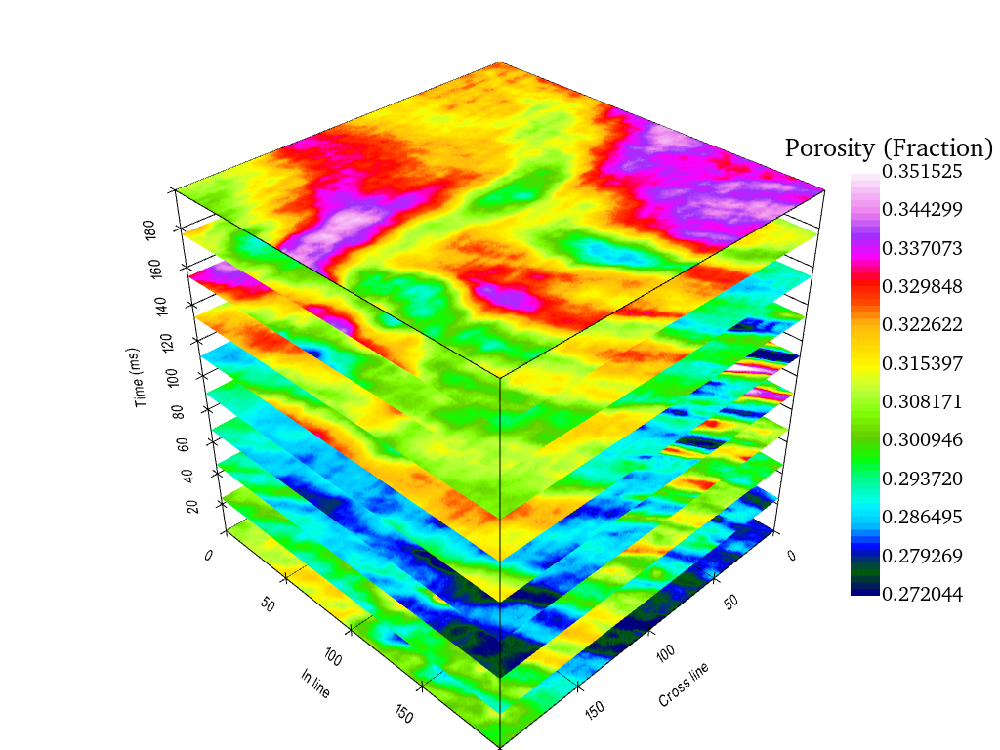

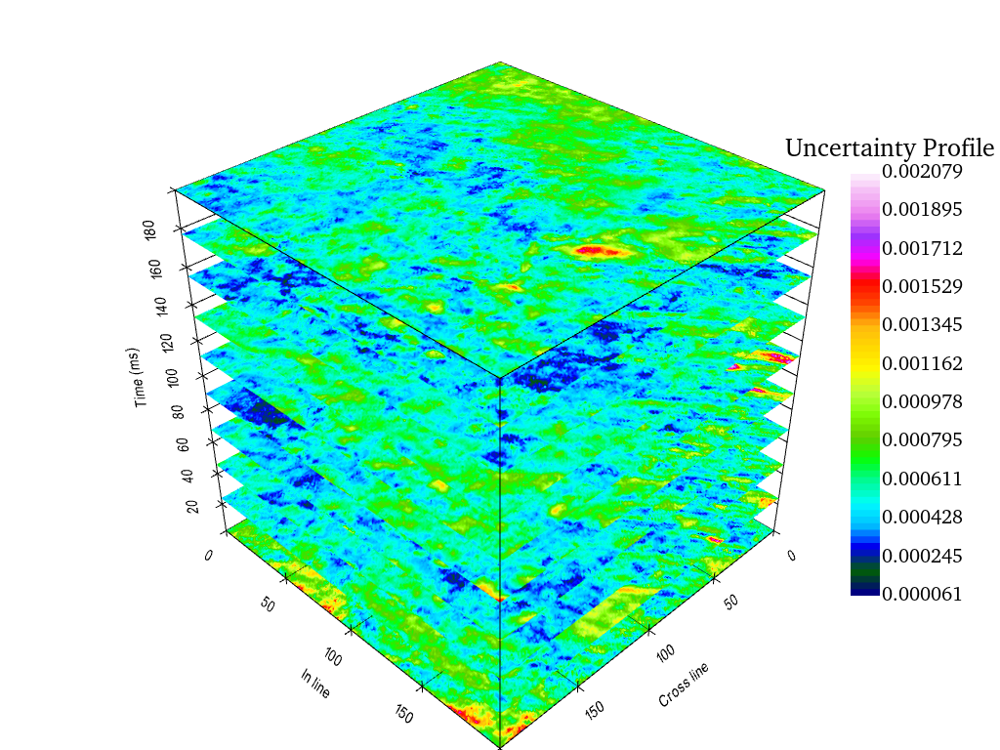

In [10]:
sliceZ= pv.Plotter()
sliceZ.add_mesh(VolumeSeis.slice_along_axis(n=10, axis="z") ,clim=[-7064,7064],flip_scalars=False ,cmap='RdGy' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
sliceZ.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
sliceZ.show()
###########################################################################################################################
sliceZ= pv.Plotter()
sliceZ.add_mesh(VolumePor.slice_along_axis(n=10, axis="z") ,clim=[0.2720436,0.3515245] ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
sliceZ.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
sliceZ.show()
###########################################################################################################################
sliceZUn= pv.Plotter()
sliceZUn.add_mesh(VolumeUn.slice_along_axis(n=10, axis="z") ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
sliceZUn.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
sliceZUn.show()

## 5. X Visualization

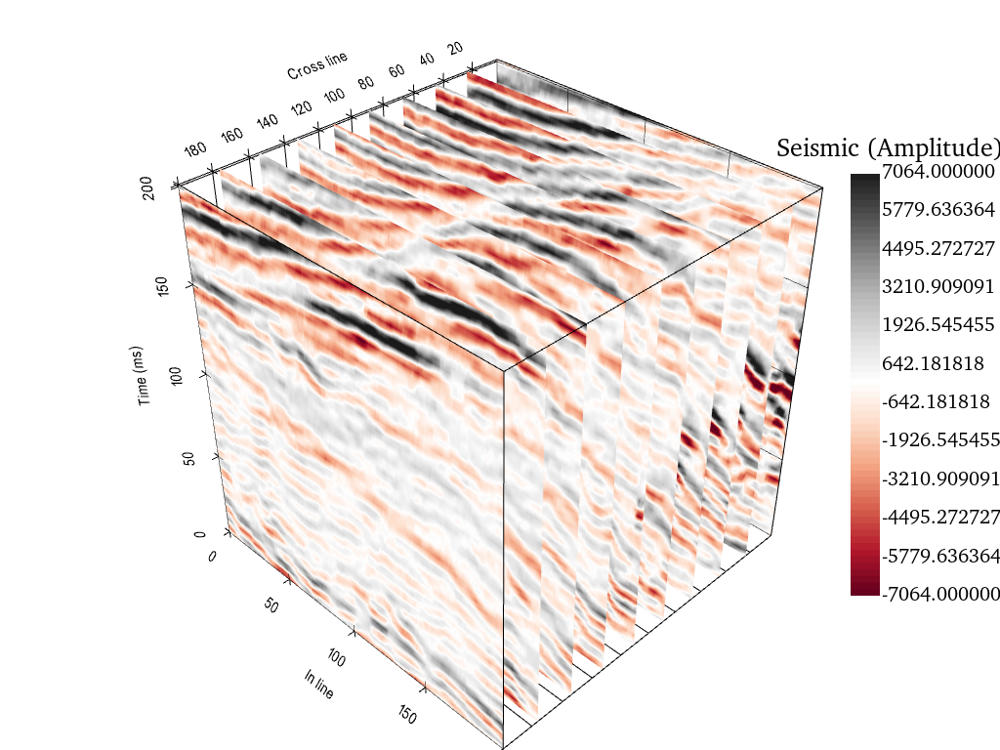

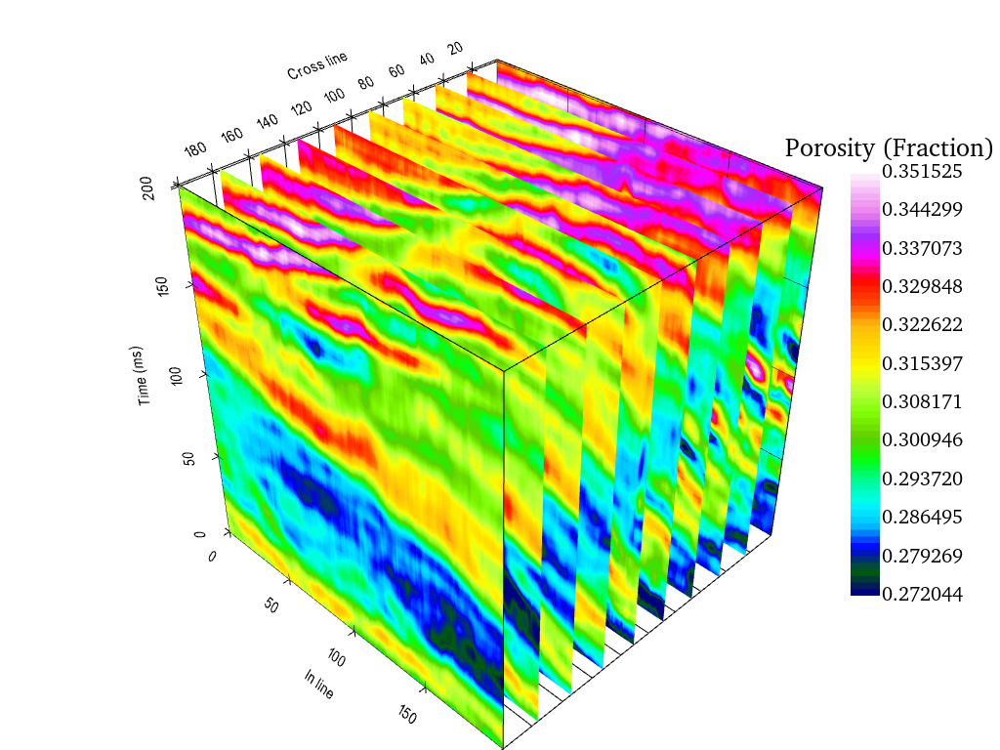

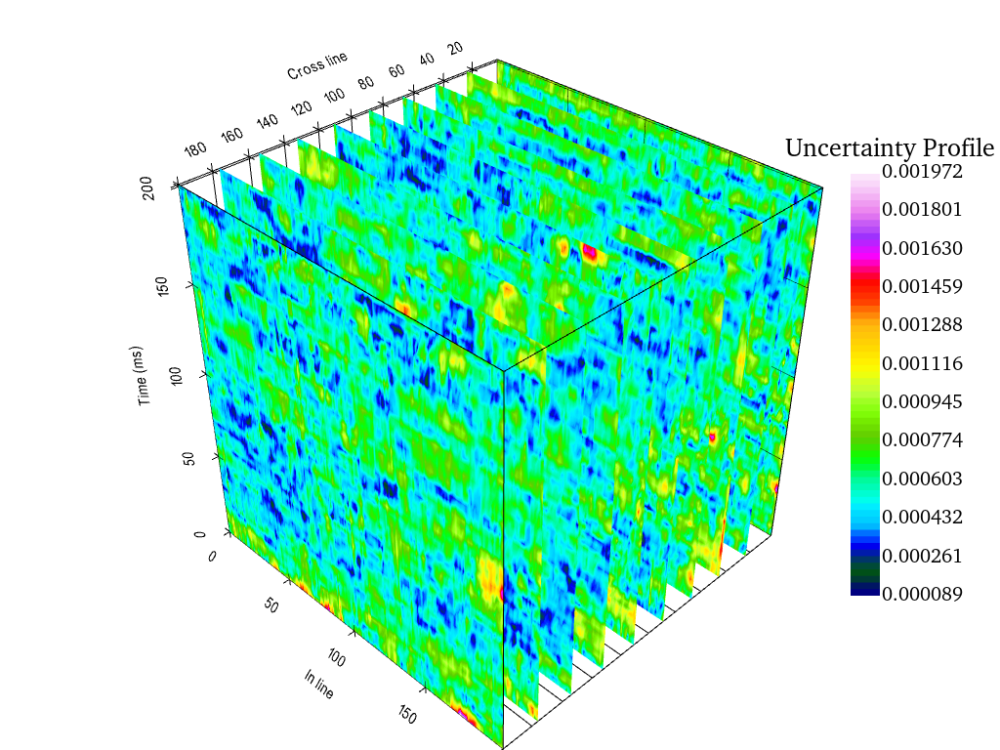

In [11]:
sliceXS= pv.Plotter()
sliceXS.add_mesh(VolumeSeis.slice_along_axis(n=10, axis="x") ,clim=[-7064,7064],flip_scalars=False ,cmap='RdGy' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
sliceXS.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
sliceXS.show()
#############################################################################################################################
sliceXP= pv.Plotter()
sliceXP.add_mesh(VolumePor.slice_along_axis(n=10, axis="x") ,clim=[0.2720436,0.3515245] ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
sliceXP.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
sliceXP.show()
#############################################################################################################################
sliceXUn= pv.Plotter()
sliceXUn.add_mesh(VolumeUn.slice_along_axis(n=10, axis="x"),flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
sliceXUn.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
sliceXUn.show()

## 5. Y Visualization

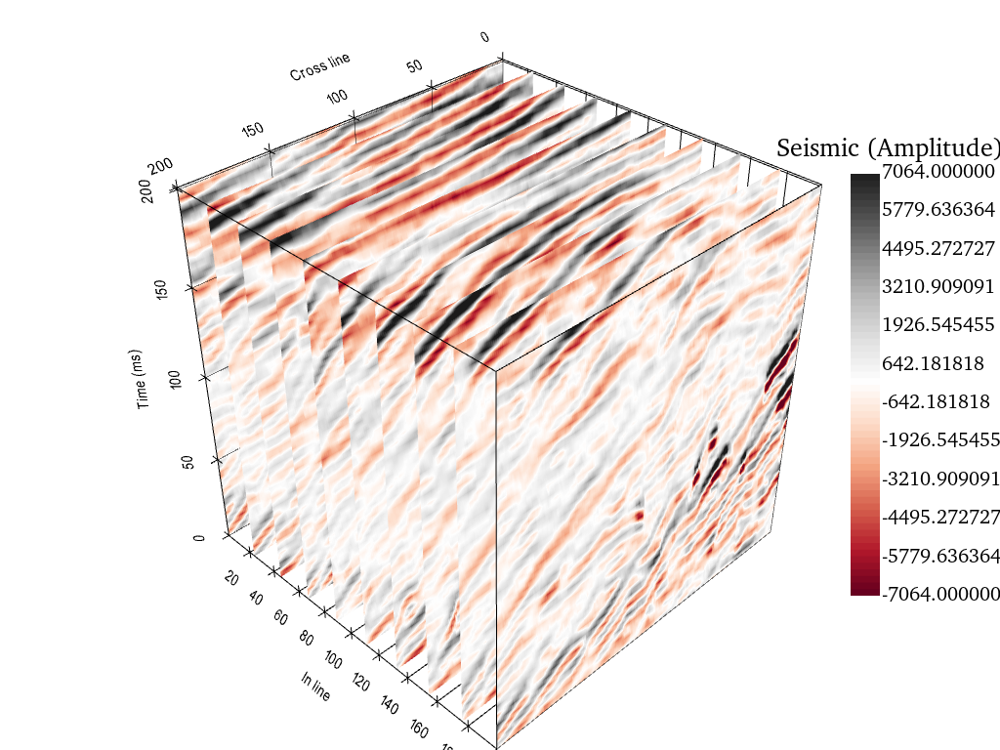

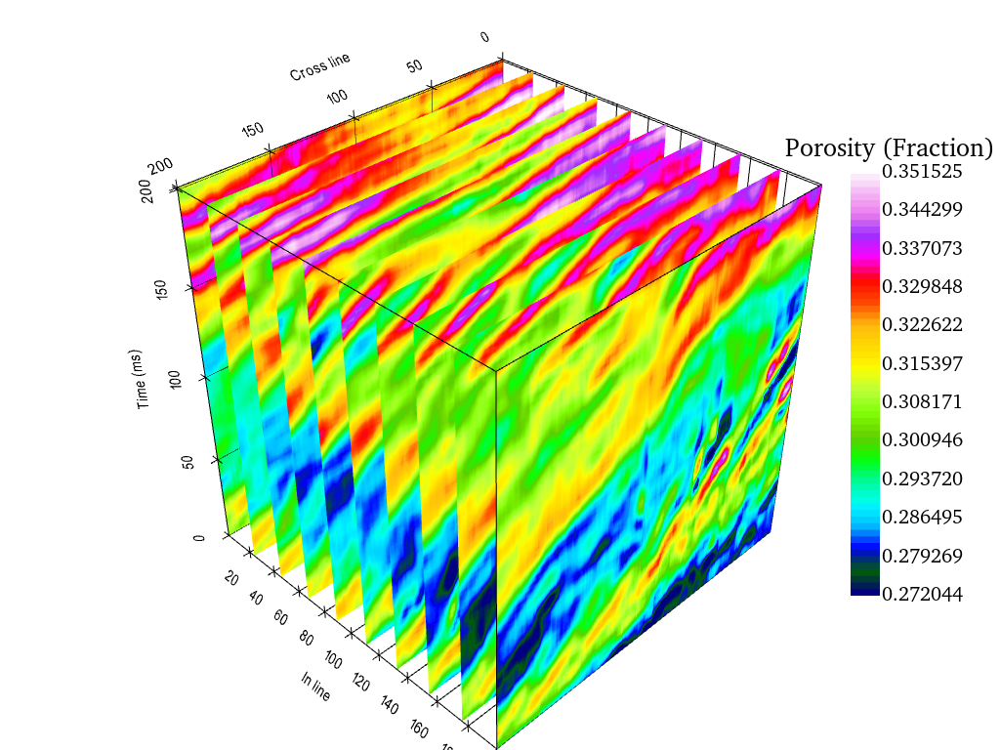

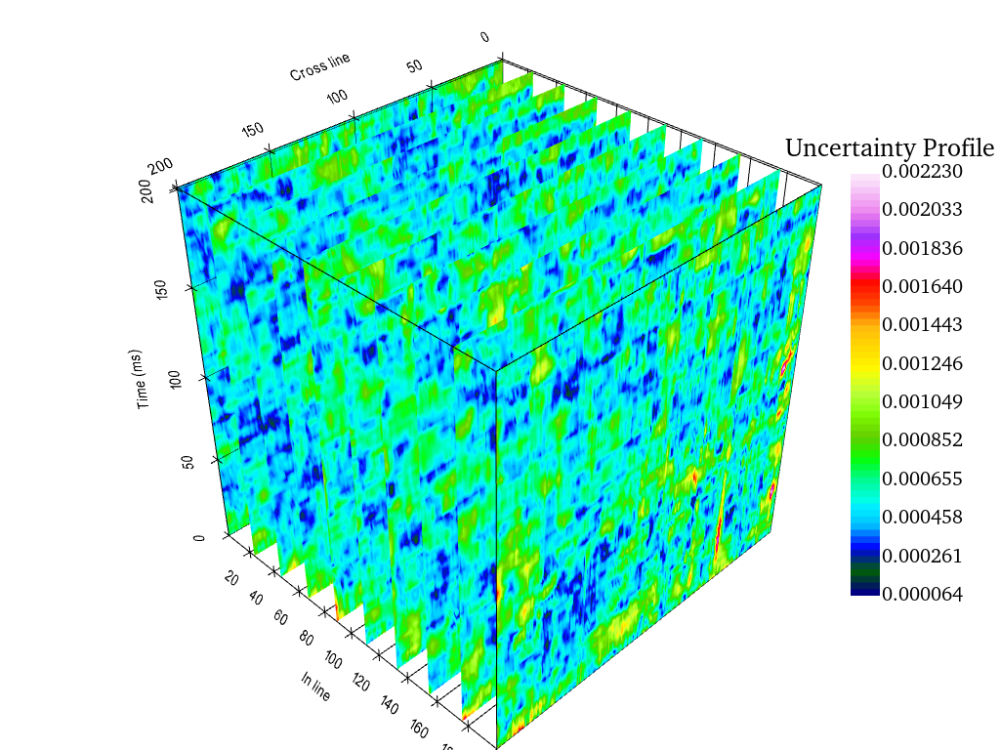

In [12]:
sliceYS= pv.Plotter()
sliceYS.add_mesh(VolumeSeis.slice_along_axis(n=10, axis="y") ,clim=[-7064,7064],flip_scalars=False ,cmap='RdGy' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
sliceYS.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
sliceYS.show()
##########################################################################################################################
sliceYP= pv.Plotter()
sliceYP.add_mesh(VolumePor.slice_along_axis(n=10, axis="y") ,clim=[0.2720436,0.3515245] ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
sliceYP.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
sliceYP.show()
##########################################################################################################################
sliceYUn= pv.Plotter()
sliceYUn.add_mesh(VolumeUn.slice_along_axis(n=10, axis="y") ,flip_scalars=False ,cmap='gist_ncar' ,lighting=False ,
               scalar_bar_args=ValuePor1 ,render_points_as_spheres=False ,render_lines_as_tubes=True ,
               use_transparency=False ,smooth_shading=True ,annotations=False ,pbr=True ,roughness=0.5 ,
               edge_color=None ,point_size=50.0 ,line_width=500 ,preference='cells')
sliceYUn.show_grid(xlabel="Cross line", ylabel="In line", zlabel="Time (ms)",
                location='outer',all_edges=True ,padding=0.0  ,color='k' ,use_2d=40 ,grid='outer')
sliceYUn.show()

# End!